### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from astropy.coordinates import SkyCoord
import astropy.units as u
from astroquery.mast import Observations
from astropy.io import fits
from astropy.wcs import WCS

import requests
import os
import glob
from tqdm import tqdm
tqdm.pandas()

In [2]:
folder = 'E:/GZ-DESI/data'

In [3]:
df = pd.read_parquet(f'{folder}/2023-03-15-cats/definitive-merged-interesting-params.parquet', engine = 'pyarrow')

In [4]:
df.category.value_counts()

merger               185278
major_interaction     11594
minor_interaction       267
Name: category, dtype: int64

In [5]:
df_merged_50 = (
    df
    .query('category == "merger"')
    [['id_str','ra', 'dec']]
    .sample(50)
)

df_major_50 = (
    df
    .query('category == "major_interaction"')
    [['id_str','ra', 'dec']]
    .sample(50)
)
df_minor_50 =(
    df
    .query('category == "minor_interaction"')
    [['id_str','ra', 'dec']]
    .sample(50)
)

In [6]:
df_merged_coords = (
    df_merged_50
    .assign(coords = df_merged_50.apply(lambda row: SkyCoord(ra = row.ra * u.deg, dec = row.dec * u.deg, frame = 'icrs'), axis = 1))
)

df_major_coords = (
    df_major_50
    .assign(coords = df_major_50.apply(lambda row: SkyCoord(ra = row.ra * u.deg, dec = row.dec * u.deg, frame = 'icrs'), axis = 1))
)

df_minor_coords = (
    df_minor_50
    .assign(coords = df_minor_50.apply(lambda row: SkyCoord(ra = row.ra * u.deg, dec = row.dec * u.deg, frame = 'icrs'), axis = 1))
)

In [9]:
def get_jpegs(ra, dec, id_str, category):
    
    save_dir = f'C:/Users/oryan/Documents/galaxy-zoo-desi/images/{category}/{id_str}-cutout.jpeg'
    if os.path.exists(save_dir):
        return save_dir
    
    url = f'https://www.legacysurvey.org/viewer/jpeg-cutout?ra={ra}&dec={dec}&layer=ls-dr10&pixscale=0.131'
    
    r = requests.get(url)
    
    try:
        with open(save_dir, 'wb') as f:
            f.write(r.content)
        return save_dir
    except:
        return 'Failed'

In [11]:
df_merged_paths = (
    df_merged_coords
    .assign(fits_path = df_merged_coords.progress_apply(lambda row: get_jpegs(row.ra, row.dec, row.id_str, 'mergers'), axis = 1))
)

  6%|▌         | 3/50 [00:05<01:32,  1.97s/it]

KeyboardInterrupt



In [17]:
df_merged_paths = (
    df_major_coords
    .assign(fits_path = df_major_coords.progress_apply(lambda row: get_jpegs(row.ra, row.dec, row.id_str, 'major-dist'), axis = 1))
)

100%|██████████| 50/50 [01:07<00:00,  1.35s/it]


In [21]:
df_merged_paths = (
    df_minor_coords
    .assign(fits_path = df_minor_coords.progress_apply(lambda row: get_jpegs(row.ra, row.dec, row.id_str, 'minor-dist'), axis = 1))
)

100%|██████████| 50/50 [01:10<00:00,  1.41s/it]


## Presenting Mergers

In [59]:
merger_images = glob.glob('C:/Users/oryan/Documents/galaxy-zoo-desi/images/mergers/*.jpeg')

In [51]:
merger_images[0]

'C:/Users/oryan/Documents/galaxy-zoo-desi/images/mergers\\100010_1045-cutout.jpeg'

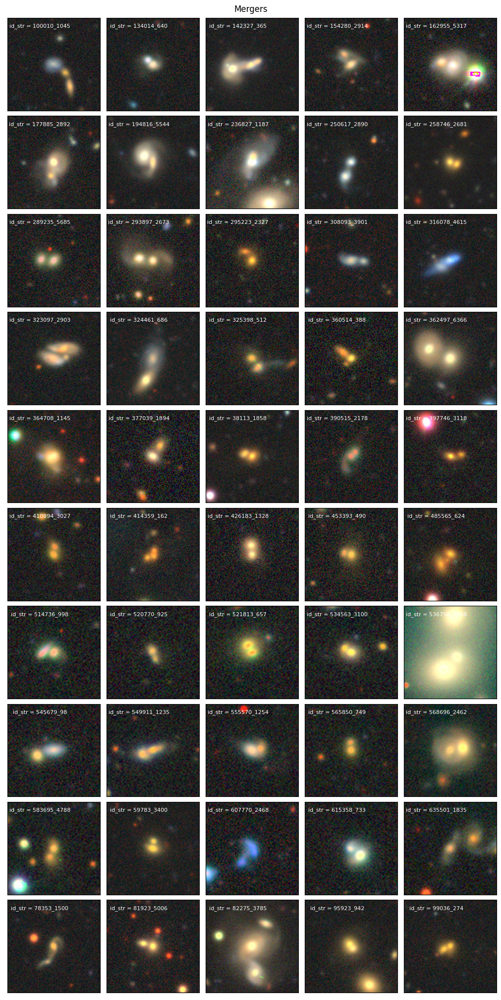

In [55]:
counter = 0

fig, axes = plt.subplots(nrows = 10, ncols = 5, figsize = (10,20), constrained_layout = True)
for i in range(10):
    for j in range(5):
        im = Image.open(merger_images[counter])
        im_arr = np.asarray(im)
        im.close()
        
        id_str = os.path.basename(merger_images[counter]).replace('-cutout.jpeg','')
        
        axes[i,j].imshow(im_arr)
        axes[i,j].set_xticks([])
        axes[i,j].set_yticks([])
        axes[i,j].text(0.35, 0.90, f'id_str = {id_str}', horizontalalignment='center', color = 'white', transform=axes[i,j].transAxes, fontsize = 8)
        
        counter += 1
fig.suptitle('Mergers')
plt.show()

### Major Disturbances

In [57]:
major_images = glob.glob('C:/Users/oryan/Documents/galaxy-zoo-desi/images/major-dist/*.jpeg')

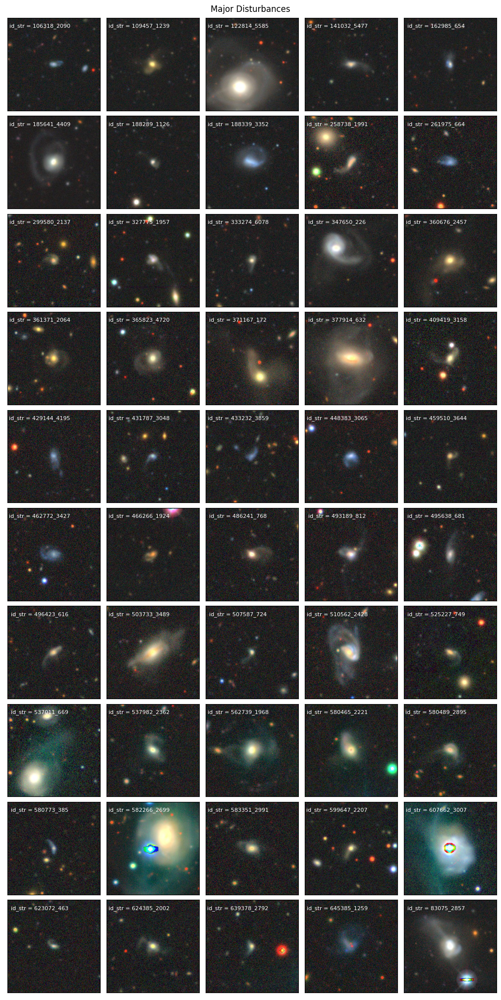

In [60]:
counter = 0

fig, axes = plt.subplots(nrows = 10, ncols = 5, figsize = (10,20), constrained_layout = True)
for i in range(10):
    for j in range(5):
        im = Image.open(major_images[counter])
        im_arr = np.asarray(im)
        im.close()
        
        id_str = os.path.basename(major_images[counter]).replace('-cutout.jpeg','')
        
        axes[i,j].imshow(im_arr)
        axes[i,j].set_xticks([])
        axes[i,j].set_yticks([])
        axes[i,j].text(0.35, 0.90, f'id_str = {id_str}', horizontalalignment='center', color = 'white', transform=axes[i,j].transAxes, fontsize = 8)
        
        counter += 1
fig.suptitle('Major Disturbances')
plt.show()

### Minor Disturbances

In [61]:
minor_images = glob.glob('C:/Users/oryan/Documents/galaxy-zoo-desi/images/minor-dist/*.jpeg')

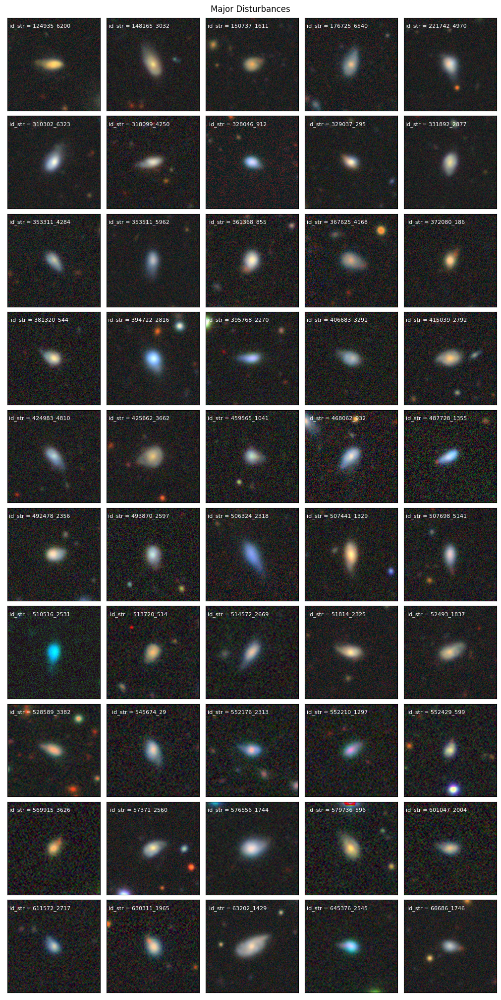

In [62]:
counter = 0

fig, axes = plt.subplots(nrows = 10, ncols = 5, figsize = (10,20), constrained_layout = True)
for i in range(10):
    for j in range(5):
        im = Image.open(minor_images[counter])
        im_arr = np.asarray(im)
        im.close()
        
        id_str = os.path.basename(minor_images[counter]).replace('-cutout.jpeg','')
        
        axes[i,j].imshow(im_arr)
        axes[i,j].set_xticks([])
        axes[i,j].set_yticks([])
        axes[i,j].text(0.35, 0.90, f'id_str = {id_str}', horizontalalignment='center', color = 'white', transform=axes[i,j].transAxes, fontsize = 8)
        
        counter += 1
fig.suptitle('Major Disturbances')
plt.show()